# APRENDIZAJE NO SUPERVISADO (DengAI)<center>



---
# Resumen
---

Este proyecto evalúa varios algoritmos de aprendizaje no supervisado para identificar agrupamientos en los datos de la competición de DE. La práctica se divide en dos partes:

Exploración y selección de características: Se analiza estadísticamente el conjunto de datos y se imputan valores nulos con técnicas iterativas. La selección de características se apoya en K-means y clustering jerárquico.

Clustering: Se aplican cuatro algoritmos de agrupamiento, uno no visto en clase. Para visualizar los resultados, se emplean técnicas de reducción de dimensionalidad.

DBSCAN obtuvo los peores resultados, mientras que los demás generaron agrupamientos similares. El mejor modelo se discutirá en las conclusiones.


---
# Inicialización
---

En cualquier trabajo desarrollado en un entorno Python es recomendable importar todos los paquetes necesarios al principio, junto a las posibles instalaciones oportunas. Además, se aprovecha para subir el archivo que contiene los datos para la realización del proyecto.

In [ ]:
# Imports generales
import warnings
import io
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import files
from scipy import cluster
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn import preprocessing
from sklearn.cluster import (
    KMeans,
    DBSCAN,
    AgglomerativeClustering,
    SpectralClustering
)
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler, scale
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer


In [ ]:
seed = 42  #Semilla aleatoria arbitraria y constante a incluir en los algoritmos estocásticos para que los experimentos sean siempre reproducibles por el profesor.

def upload_files (index_fields=None):
  uploaded = files.upload()
  for fn in uploaded.keys():
    print('User uploaded file "{name}" with length {length} bytes'.format(
        name=fn, length=len(uploaded[fn])))
    df = pd.read_csv(io.StringIO(uploaded[fn].decode('utf-8')), index_col = index_fields)
    return df

In [ ]:
#Subir el conjunto de entrenamiento sin variable objetivo (dengue_features_train.csv)
train_raw = upload_files()
train_raw.head()

Saving dengue_features_train.csv to dengue_features_train.csv
User uploaded file "dengue_features_train.csv" with length 287139 bytes


,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm
0,sj,1990,18,1990-04-30,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,...,32.00,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0
1,sj,1990,19,1990-05-07,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,...,17.94,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6
2,sj,1990,20,1990-05-14,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,...,26.10,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4
3,sj,1990,21,1990-05-21,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,...,13.90,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0
4,sj,1990,22,1990-05-28,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,...,12.20,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8


Se guarda el dataset original en una variable aparte, para tener en cualquier momentos los datos en bruto.

In [ ]:
#Definimos el dataset en dos variables: una que será modificada y otra que no

train_raw = pd.read_csv('dengue_features_train.csv')
train = pd.read_csv('dengue_features_train.csv')

---
# Exploración
---

Este apartado explora a fondo los datos, analizando su estructura, tipo, transformaciones básicas, estadística descriptiva y el tratamiento de valores nulos, outliers y duplicados. Esta fase resulta clave para optimizar los resultados.

## Estructura de los datos


Primero, se analiza el tamaño del dataset en términos de filas y características. También se examinan las principales propiedades de las variables, incluyendo tipo de datos, nombres de columnas y una visualización inicial de los valores nulos, complementando la información del origen de datos.

In [ ]:
#Cantidad de instancias y columnas
train.shape

(1456, 24)

In [ ]:
#Información básica de los datos
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1456 entries, 0 to 1455
Data columns (total 24 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   city                                   1456 non-null   object 
 1   year                                   1456 non-null   int64  
 2   weekofyear                             1456 non-null   int64  
 3   week_start_date                        1456 non-null   object 
 4   ndvi_ne                                1262 non-null   float64
 5   ndvi_nw                                1404 non-null   float64
 6   ndvi_se                                1434 non-null   float64
 7   ndvi_sw                                1434 non-null   float64
 8   precipitation_amt_mm                   1443 non-null   float64
 9   reanalysis_air_temp_k                  1446 non-null   float64
 10  reanalysis_avg_temp_k                  1446 non-null   float64
 11  rean

Toda la información es comparada con la descripción de cada variable, indicadas por la competición.

## Transformaciones iniciales básicas

Inicialmente, la columna city_bin se binariza, se eliminan las variables irrelevantes y las temperaturas se convierten a grados Celsius.

In [ ]:
#Binarización para la variable categórica city en el conjunto de datos
lb = preprocessing.LabelBinarizer()
train['city_bin'] = lb.fit_transform(train['city'])

In [ ]:
#Eliminación de la variable city ya que no es necesaria después de la binarización
train.drop("city", axis = 1, inplace = True)

In [ ]:
#Eliminación de la variable week_start_date por ser de tipo cadena de texto sin formato
train.drop("week_start_date", axis = 1, inplace = True)

In [ ]:
#Columnas kelvin a celsius
train['reanalysis_air_temp_c'] = train['reanalysis_air_temp_k'] - 273.15
train['reanalysis_max_air_temp_c'] = train['reanalysis_max_air_temp_k'] - 273.15
train['reanalysis_min_air_temp_c'] = train['reanalysis_min_air_temp_k'] - 273.15
train['reanalysis_avg_temp_c'] = train['reanalysis_avg_temp_k'] - 273.15
train['reanalysis_dew_point_temp_c'] = train['reanalysis_dew_point_temp_k'] - 273.15
train['reanalysis_tdtr_c'] = train['reanalysis_tdtr_k']

#Se eliminan las que están en kelvin
train = train.drop(columns=['reanalysis_air_temp_k', 'reanalysis_max_air_temp_k',
                            'reanalysis_min_air_temp_k', 'reanalysis_avg_temp_k',
                            'reanalysis_dew_point_temp_k', 'reanalysis_tdtr_k'])



Hay que comprobar el número de columnas nuevamente y de paso se ven las primeras instancias del dataset.

In [ ]:
train.head()

,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,...,station_max_temp_c,station_min_temp_c,station_precip_mm,city_bin,reanalysis_air_temp_c,reanalysis_max_air_temp_c,reanalysis_min_air_temp_c,reanalysis_avg_temp_c,reanalysis_dew_point_temp_c,reanalysis_tdtr_c
0,1990,18,0.122600,0.103725,0.198483,0.177617,12.42,32.00,73.365714,12.42,...,29.4,20.0,16.0,1,24.422857,26.65,22.75,24.592857,19.264286,2.628571
1,1990,19,0.169900,0.142175,0.162357,0.155486,22.82,17.94,77.368571,22.82,...,31.7,22.2,8.6,1,25.061429,27.75,23.25,25.292857,20.801429,2.371429
2,1990,20,0.032250,0.172967,0.157200,0.170843,34.54,26.10,82.052857,34.54,...,32.2,22.8,41.4,1,25.631429,27.35,24.15,25.728571,22.284286,2.300000
3,1990,21,0.128633,0.245067,0.227557,0.235886,15.36,13.90,80.337143,15.36,...,33.3,23.3,4.0,1,25.837143,28.25,23.85,26.078571,22.160000,2.428571
4,1990,22,0.196200,0.262200,0.251200,0.247340,7.52,12.20,80.460000,7.52,...,35.0,23.9,5.8,1,26.368571,28.75,24.35,26.514286,22.671429,3.014286


## Estadística descripitiva

Es indispensable hacer un breve estudio de la estadística descriptiva básica del dataset proporcionado.

In [ ]:
#Magnitudes estadísticas básicas
train.describe(include = 'all')


,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,...,station_max_temp_c,station_min_temp_c,station_precip_mm,city_bin,reanalysis_air_temp_c,reanalysis_max_air_temp_c,reanalysis_min_air_temp_c,reanalysis_avg_temp_c,reanalysis_dew_point_temp_c,reanalysis_tdtr_c
count,1456.000000,1456.000000,1262.000000,1404.000000,1434.000000,1434.000000,1443.000000,1446.000000,1446.000000,1443.000000,...,1436.000000,1442.000000,1434.000000,1456.000000,1446.000000,1446.000000,1446.000000,1446.000000,1446.000000,1446.000000
mean,2001.031593,26.503434,0.142294,0.130553,0.203783,0.202305,45.760388,40.151819,82.161959,45.760388,...,32.452437,22.102150,39.326360,0.642857,25.551852,30.277109,22.569156,26.075578,22.096356,4.903754
std,5.408314,15.019437,0.140531,0.119999,0.073860,0.083903,43.715537,43.434399,7.153897,43.715537,...,1.959318,1.574066,47.455314,0.479322,1.362420,3.234601,2.565364,1.261715,1.527810,3.546445
min,1990.000000,1.000000,-0.406250,-0.456100,-0.015533,-0.063457,0.000000,0.000000,57.787143,0.000000,...,26.700000,14.700000,0.000000,0.000000,21.485714,24.650000,13.750000,21.742857,16.492857,1.357143
25%,1997.000000,13.750000,0.044950,0.049217,0.155087,0.144209,9.800000,13.055000,77.177143,9.800000,...,31.100000,21.100000,8.700000,0.000000,24.508929,27.850000,20.750000,25.107143,20.968929,2.328571
50%,2002.000000,26.500000,0.128817,0.121429,0.196050,0.189450,38.340000,27.245000,80.301429,38.340000,...,32.800000,22.200000,23.850000,1.000000,25.496429,29.250000,23.050000,26.139286,22.490714,2.857143
75%,2005.000000,39.250000,0.248483,0.216600,0.248846,0.246982,70.235000,52.200000,86.357857,70.235000,...,33.900000,23.300000,53.900000,1.000000,26.683571,32.350000,24.750000,27.057143,23.310000,7.625000
max,2010.000000,53.000000,0.508357,0.454429,0.538314,0.546017,390.600000,570.500000,98.610000,390.600000,...,42.200000,25.600000,543.300000,1.000000,29.050000,40.850000,26.750000,29.778571,25.300000,16.028571


Así, es posible analizar características clave de los datos, como los valores medios, que permiten estimar el orden de magnitud de las mediciones y el momento en que fueron tomadas. Esta información se complementa con los cuartiles y medidas de dispersión

A continuación, se presentan los diagramas de dispersión a pares. Dado el elevado número de columnas en el dataset, se ha optado por mostrar todas las gráficas para una cobertura completa en el análisis práctico.

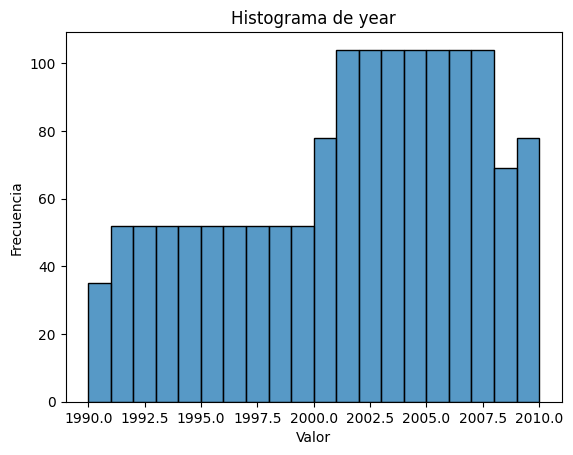

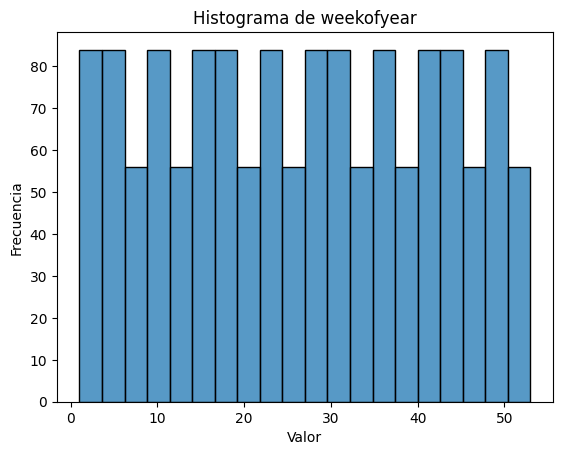

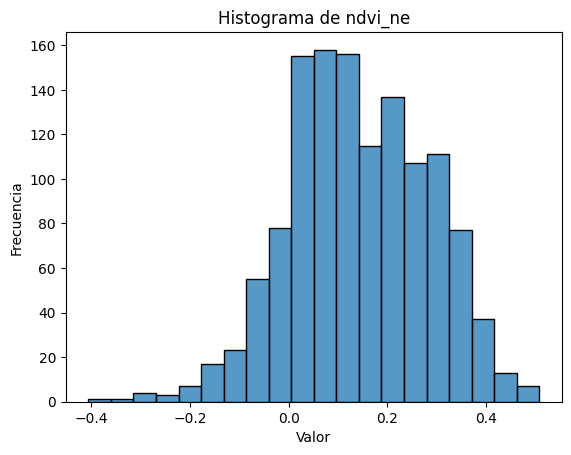

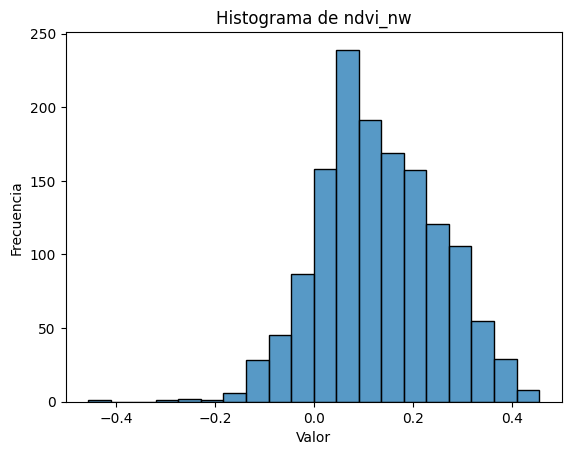

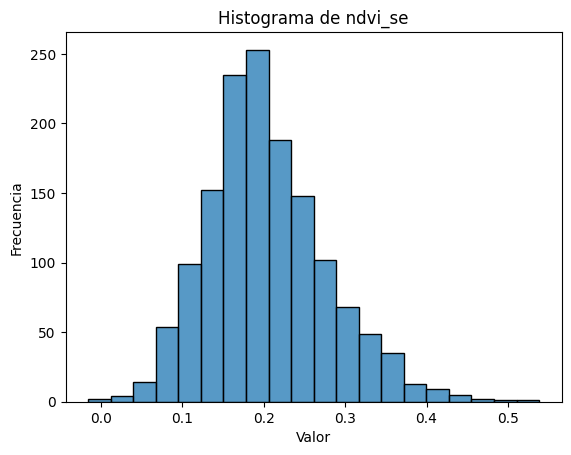

...

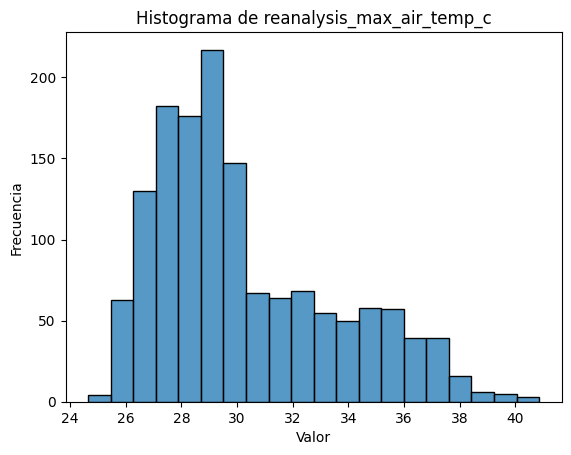

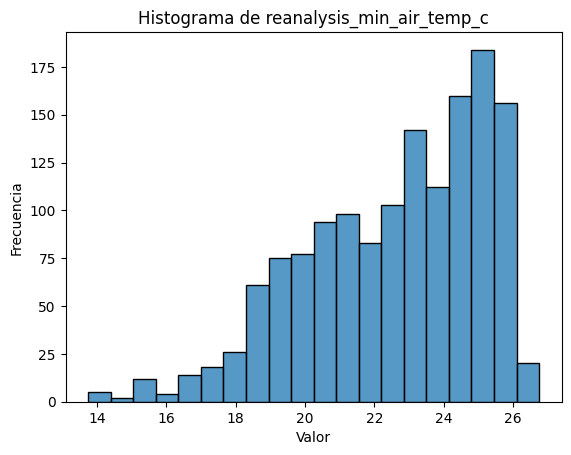

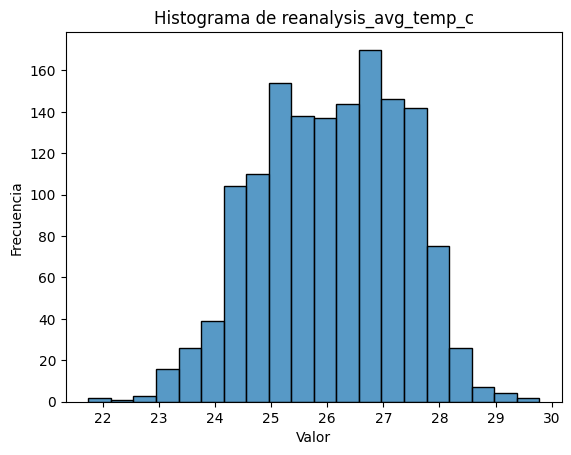

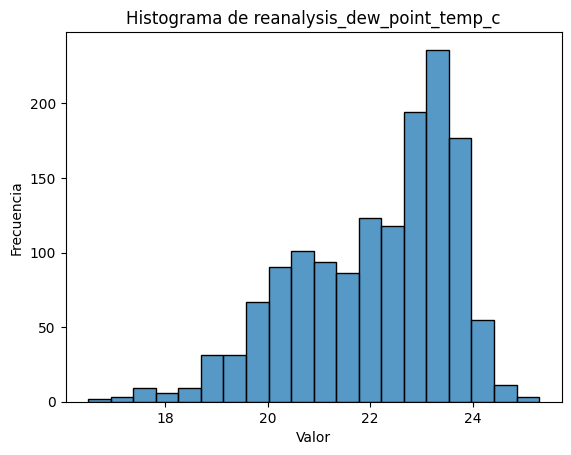

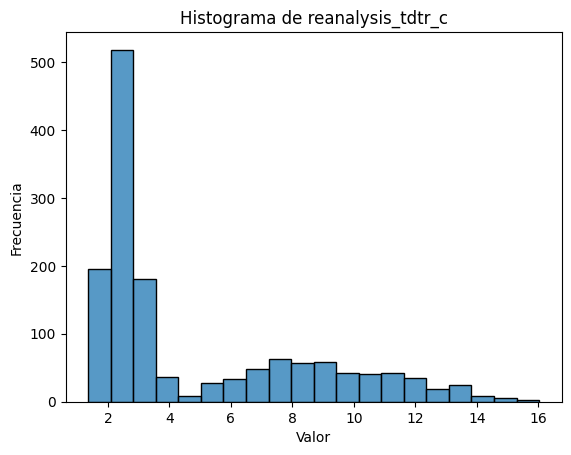

In [ ]:
#Mostrar histograma para cada columna
for columna in train.columns:
    sns.histplot(data=train, x= columna, bins=20)
    plt.title(f'Histograma de {columna}')
    plt.xlabel('Valor')
    plt.ylabel('Frecuencia')
    plt.show()

La mayoría de datos presentan una distribución normal, exceptuando algunas magnitudes que no pueden adoptar valores negativos (como la humedad). Se ve algunas zonas con aparente ruido, como el caso de reanalysis_relative_humidity_percent, station_diur_temp_rng_c, entre otras. Las variables temporales siguen distribuciones uniformes. Se sigue con el estudio de dispersión por pareja de variables:

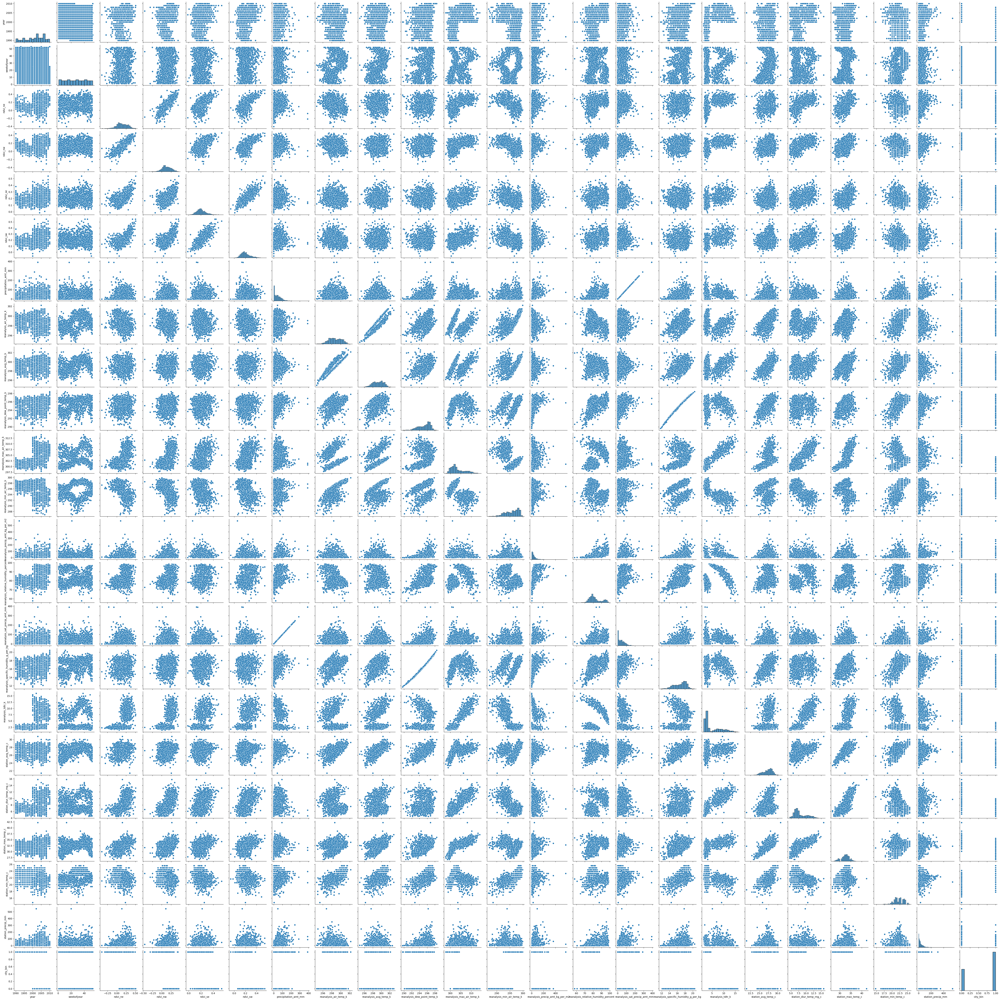

In [ ]:
#Primeras 11 variables con las segundas 12
sns.pairplot(pd.concat([train], axis=1))

No se observan variables con una correlación excesiva, tanto lineal como no lineal, salvo en dos casos. Esto se analizará con mayor detalle en la matriz de correlación durante la selección de características, dado que estas variables presentan una relación lineal.

## Tratamiento de valores nulos

El tratamiento de valores nulos es una etapa clave en la exploración de datos. Primero, se analiza la cantidad de nulos en cada columna.

In [ ]:
#Valores nulos totales por variable
train.isnull().sum()

year                                       0
weekofyear                                 0
ndvi_ne                                  194
ndvi_nw                                   52
ndvi_se                                   22
ndvi_sw                                   22
precipitation_amt_mm                      13
reanalysis_precip_amt_kg_per_m2           10
reanalysis_relative_humidity_percent      10
reanalysis_sat_precip_amt_mm              13
reanalysis_specific_humidity_g_per_kg     10
station_avg_temp_c                        43
station_diur_temp_rng_c                   43
station_max_temp_c                        20
station_min_temp_c                        14
station_precip_mm                         22
city_bin                                   0
reanalysis_air_temp_c                     10
reanalysis_max_air_temp_c                 10
reanalysis_min_air_temp_c                 10
reanalysis_avg_temp_c                     10
reanalysis_dew_point_temp_c               10
reanalysis


Se quiere, mediante un algoritmo de iteración, estimar los valores nulos de todas las filas. Las referencias para aplicar este tipo de métodos de inferencia de nulos son:

https://cesarquezadab.com/2021/09/19/guia-sobre-tecnicas-de-imputacion-de-datos-con-python/
https://machinelearningmastery.com/handle-missing-data-python/



In [ ]:
imp = IterativeImputer(max_iter=10, random_state=0)

#Algoritmo de iteración
imp = IterativeImputer(max_iter=10, random_state=0)


#Realizamos la imputación multivariada de regresión (train)
train2 = pd.DataFrame(imp.fit_transform(train), columns=train.columns)

print(train2.isnull().sum()) #Cantidad de nulos
print(train2.shape)

year                                     0
weekofyear                               0
ndvi_ne                                  0
ndvi_nw                                  0
ndvi_se                                  0
ndvi_sw                                  0
precipitation_amt_mm                     0
reanalysis_precip_amt_kg_per_m2          0
reanalysis_relative_humidity_percent     0
reanalysis_sat_precip_amt_mm             0
reanalysis_specific_humidity_g_per_kg    0
station_avg_temp_c                       0
station_diur_temp_rng_c                  0
station_max_temp_c                       0
station_min_temp_c                       0
station_precip_mm                        0
city_bin                                 0
reanalysis_air_temp_c                    0
reanalysis_max_air_temp_c                0
reanalysis_min_air_temp_c                0
reanalysis_avg_temp_c                    0
reanalysis_dew_point_temp_c              0
reanalysis_tdtr_c                        0
dtype: int6

Inicialmente, el algoritmo emplea una técnica básica para detectar valores nulos. En cada iteración, selecciona una característica faltante como variable dependiente y usa el resto como independientes en un modelo de regresión para estimar los valores perdidos. Este proceso se repite hasta alcanzar un umbral de 10 iteraciones.

Los resultados son favorables, ya que la estadística descriptiva muestra que no hay variaciones significativas entre los datos originales y los imputados. A continuación, se comparan estas magnitudes entre los datos en bruto y los procesados.

In [ ]:
#Comparamos la estadística básica antes y después de ser imputadas
train2.describe()

,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,city_bin
count,1456.000000,1456.000000,1456.000000,1456.000000,1456.000000,1456.000000,1456.000000,1456.000000,1456.000000,1456.000000,...,1456.000000,1456.000000,1456.000000,1456.000000,1456.000000,1456.000000,1456.000000,1456.000000,1456.000000,1456.000000
mean,2001.031593,26.503434,0.132360,0.128924,0.203683,0.202072,45.760388,298.701896,299.225908,295.246330,...,82.162387,45.760388,16.746426,4.906027,27.183008,8.112639,32.457646,22.101430,39.389896,0.642857
std,5.408314,15.019437,0.135642,0.118653,0.073363,0.083375,43.519806,1.357732,1.258352,1.522578,...,7.129512,43.519806,1.537187,3.550319,1.281398,2.139884,1.951831,1.567471,47.199633,0.479322
min,1990.000000,1.000000,-0.406250,-0.456100,-0.015533,-0.063457,0.000000,294.635714,294.892857,289.642857,...,57.787143,0.000000,11.715714,1.357143,21.400000,4.528571,26.700000,14.700000,0.000000,0.000000
25%,1997.000000,13.750000,0.040388,0.049217,0.155625,0.144718,9.960000,297.665000,298.264286,294.130357,...,77.226429,9.960000,15.561429,2.328571,26.314286,6.528571,31.100000,21.100000,8.700000,0.000000
50%,2002.000000,26.500000,0.112465,0.117105,0.195843,0.187957,38.710000,298.659286,299.285714,295.625714,...,80.369286,38.710000,17.065000,2.857143,27.414286,7.350000,32.800000,22.200000,24.100000,1.000000
75%,2005.000000,39.250000,0.231589,0.212943,0.247735,0.246914,70.047500,299.827500,300.207143,296.456071,...,86.041429,70.047500,17.974643,7.646429,28.142857,9.700000,33.900000,23.300000,53.900000,1.000000
max,2010.000000,53.000000,0.508357,0.454429,0.538314,0.546017,390.600000,302.200000,302.928571,298.450000,...,98.610000,390.600000,20.461429,16.028571,30.800000,15.800000,42.200000,25.600000,543.300000,1.000000


In [ ]:
train.describe()

,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_avg_temp_k,reanalysis_dew_point_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,city_bin
count,1456.000000,1456.000000,1262.000000,1404.000000,1434.000000,1434.000000,1443.000000,1446.000000,1446.000000,1446.000000,...,1446.000000,1443.000000,1446.000000,1446.000000,1413.000000,1413.000000,1436.000000,1442.000000,1434.000000,1456.000000
mean,2001.031593,26.503434,0.142294,0.130553,0.203783,0.202305,45.760388,298.701852,299.225578,295.246356,...,82.161959,45.760388,16.746427,4.903754,27.185783,8.059328,32.452437,22.102150,39.326360,0.642857
std,5.408314,15.019437,0.140531,0.119999,0.073860,0.083903,43.715537,1.362420,1.261715,1.527810,...,7.153897,43.715537,1.542494,3.546445,1.292347,2.128568,1.959318,1.574066,47.455314,0.479322
min,1990.000000,1.000000,-0.406250,-0.456100,-0.015533,-0.063457,0.000000,294.635714,294.892857,289.642857,...,57.787143,0.000000,11.715714,1.357143,21.400000,4.528571,26.700000,14.700000,0.000000,0.000000
25%,1997.000000,13.750000,0.044950,0.049217,0.155087,0.144209,9.800000,297.658929,298.257143,294.118929,...,77.177143,9.800000,15.557143,2.328571,26.300000,6.514286,31.100000,21.100000,8.700000,0.000000
50%,2002.000000,26.500000,0.128817,0.121429,0.196050,0.189450,38.340000,298.646429,299.289286,295.640714,...,80.301429,38.340000,17.087143,2.857143,27.414286,7.300000,32.800000,22.200000,23.850000,1.000000
75%,2005.000000,39.250000,0.248483,0.216600,0.248846,0.246982,70.235000,299.833571,300.207143,296.460000,...,86.357857,70.235000,17.978214,7.625000,28.157143,9.566667,33.900000,23.300000,53.900000,1.000000
max,2010.000000,53.000000,0.508357,0.454429,0.538314,0.546017,390.600000,302.200000,302.928571,298.450000,...,98.610000,390.600000,20.461429,16.028571,30.800000,15.800000,42.200000,25.600000,543.300000,1.000000


## Tratamiento de valores duplicados

No hay valores duplicados, por lo que no hay que hacer ningún tipo de tratamiento.

In [ ]:
#Valores duplicados
train2[train2.duplicated(keep=False)]

,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,...,station_max_temp_c,station_min_temp_c,station_precip_mm,city_bin,reanalysis_air_temp_c,reanalysis_max_air_temp_c,reanalysis_min_air_temp_c,reanalysis_avg_temp_c,reanalysis_dew_point_temp_c,reanalysis_tdtr_c


## Tratamiento de valores atípicos

Es importante hacer un tratamiento adecuado de los outliers para garantizar los resultados de los algoritmos de aprendizaje automático. En este caso, para evitar fallos o datos atípicos meteorológicos, se van a eliminar los outliers detectados. Para ello, se va a usar la técnica basada en el análisis de componentes principales y se define el umbral como el 98%.

https://cienciadedatos.net/documentos/py21-deteccion-anomalias-pca-python

In [ ]:
#Estandarizar los datos
scaler = StandardScaler()
scaled_data = scaler.fit_transform(train2)

#Aplicar PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(scaled_data)

#Convertir los componentes principales a un DataFrame
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])

#Calcular la distancia Mahalanobis para detectar outliers
mean = np.mean(principal_components, axis=0)
cov_matrix = np.cov(principal_components, rowvar=False)
inv_cov_matrix = np.linalg.inv(cov_matrix)
mahalanobis_distances = np.apply_along_axis(lambda x: np.sqrt(np.dot(np.dot((x - mean).T, inv_cov_matrix), (x - mean))), 1, principal_components)

#Definir un umbral para identificar outliers
threshold = np.percentile(mahalanobis_distances, 98)
outliers = mahalanobis_distances > threshold

#Mostrar los outliers
outliers_df = train2[outliers]
#print("Outliers detectados:\n", outliers_df)

In [ ]:
#Conjunto sin outliers
train2 = train2[~outliers]

## Identificación de correlaciones

Para observar la correlación entre características, se utiliza el coeficiente de correlación de Pearson, con la matriz de correlaciones. Se hará más énfasis en el siguiente apartado del proyecto.

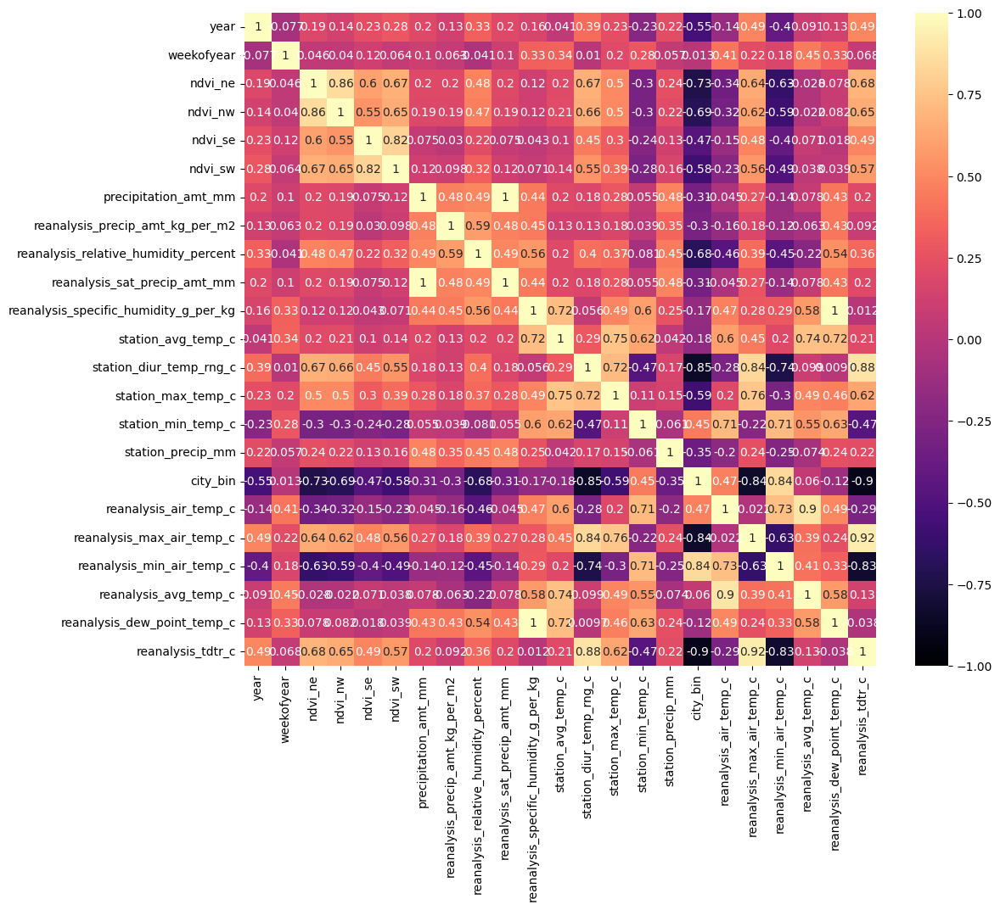

In [ ]:
#Matriz de correlaciones
plt.figure(figsize=(12, 10))
sns.heatmap(train2.corr(), vmin=-1, vmax=1, cmap='magma', annot=True)
plt.show()


---
# Características
---

En esta etapa, se seleccionan las características que alimentarán los algoritmos de aprendizaje automático. Primero, la matriz de correlaciones revela dos pares de variables completamente correlacionadas, por lo que se conservará solo una de cada pareja.


*   precipitation_amt_mm y reanalysis_precip_amt_kg_per_m2
*   reanalysis_specific_humidity_g_per_kg y reanalysis_dew_point_temp_c



In [ ]:
#Se elimina una de las variables de cada pareja
train3 = train2.drop(['reanalysis_precip_amt_kg_per_m2','reanalysis_dew_point_temp_c'], axis = 1)

Con el fin de observar de otra manera la relacion de las variables, hacemos una representación en PCA de las mismas

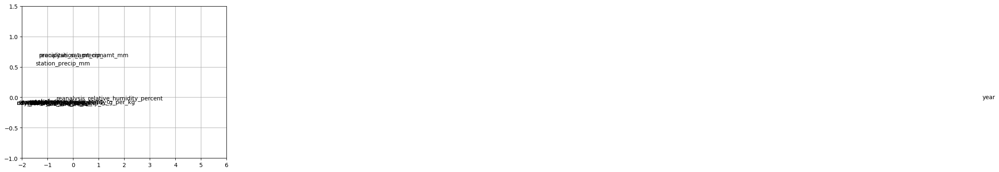

In [ ]:
#Matriz transpuesta para el análisis de las características
train_features = train3.T
names =  train_features.index

#Normalization of the data
min_max_scaler = preprocessing.MinMaxScaler()
features_norm = min_max_scaler.fit_transform(train_features)

#Principal Component Analysis
estimator = PCA(n_components = 4)
X_pca = estimator.fit_transform(features_norm)
#print("Componentes lineales:\n", estimator.components_)
#print("\nRatio de variabilidad: ", estimator.explained_variance_ratio_, "\n")

fig, ax = plt.subplots()
for i in range(len(X_pca)):
    plt.text(X_pca[i][0], X_pca[i][1], names[i])
plt.xlim(-2, 6)
plt.ylim(-1, 1.5)
ax.grid(True)
plt.show()

In [ ]:
# Normalización de los datos
min_max_scaler = preprocessing.MinMaxScaler()
features_norm = min_max_scaler.fit_transform(train_features)

# Análisis de Componentes Principales
estimator = PCA(n_components=4)
X_pca = estimator.fit_transform(features_norm)

# Imprimir la matriz de componentes y la varianza explicada
componentes = estimator.components_
varianza_explicada = estimator.explained_variance_ratio_

print("Componentes Principales (Matriz de Cargas):\n", componentes)
print("\nVarianza Explicada por cada Componente Principal:", varianza_explicada)

Componentes Principales (Matriz de Cargas):
 [[ 0.02654921  0.02653568  0.02649969 ...  0.02649309  0.02648401
   0.02646754]
 [-0.01970131 -0.01653607 -0.00476866 ...  0.00032733  0.00212732
   0.00407102]
 [ 0.00274079 -0.00712756  0.00706135 ... -0.02571109 -0.02087779
  -0.02013337]
 [-0.01092072 -0.01128953 -0.01078316 ... -0.00989234 -0.00854909
  -0.00695179]]

Varianza Explicada por cada Componente Principal: [9.98518415e-01 1.03389824e-03 3.74924543e-04 5.52680019e-05]


Estos valores indican que la mayoría de la variabilidad en los datos se explica por el primer componente principal, mientras que el segundo componente principal explica solo una pequeña fracción adicional de la variabilidad. Puede ser razonable retener solo el primer componente principal si explica la mayoría de la variabilidad en los datos, pero se prefiere seguir con el razonamiento del problema.

## Número óptimo de características: Kmeans

Antes de seleccionar las características, se estima su número óptimo utilizando K-means junto con las técnicas de la curva de Elbow y la puntuación de silueta. Además, se elimina la variable year, ya que actúa como un outlier que distorsiona los datos, un problema frecuente en variables meteorológicas y temporales. \
https://www.kaggle.com/code/hasanaltunay/kmeans-clustering-with-pca

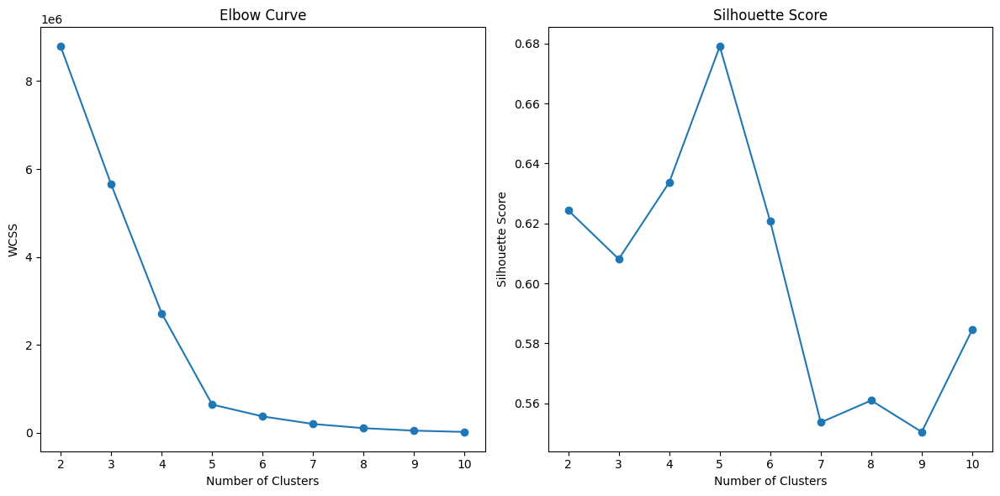

In [ ]:
warnings.filterwarnings("ignore")

def cluster_Wcss_Silhouette(data, k_max):
    wcss = []
    silhouette_scores = []

    for k in range(2, k_max + 1):
        kmeans = KMeans(n_clusters=k, init='k-means++', random_state=0)
        kmeans.fit(data)

        #Calcular WCSS (Within-Cluster Sum of Squares)
        wcss.append(kmeans.inertia_)

        #Calcular Silhouette score
        if k > 1:  # Silhouette score solo se calcula cuando hay más de un clúster
            labels = kmeans.labels_
            silhouette_avg = silhouette_score(data, labels)
            silhouette_scores.append(silhouette_avg)

    #Graficar Elbow Curve
    plt.figure(figsize=(12, 6))

    #WCSS
    plt.subplot(1, 2, 1)
    plt.plot(range(2, k_max + 1), wcss, marker='o')
    plt.title('Elbow Curve')
    plt.xlabel('Number of Clusters')
    plt.ylabel('WCSS')

    #Silhouette Score
    plt.subplot(1, 2, 2)
    plt.plot(range(2, k_max + 1), silhouette_scores, marker='o')
    plt.title('Silhouette Score')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Silhouette Score')

    plt.tight_layout()
    plt.show()

#Ejemplo de uso con train3.drop(columns=['year']).T y hasta 10 clústers
cluster_Wcss_Silhouette(train3.drop(columns=['year']).T, 10)

Se observa que el número óptimo de clústers en ambas técnicas es de 5. Ahora hay que escoger las características que garanticen los mejores resultados.

## Selección: clustering jerárquico

Se escoge el método de clúster jerárquico para realizar una estimación de los clústers que conforman el conjunto de características. Para justificar la anterior decisión de eliminar la variable year, se realiza el diagrama de árbol del dataset completo.

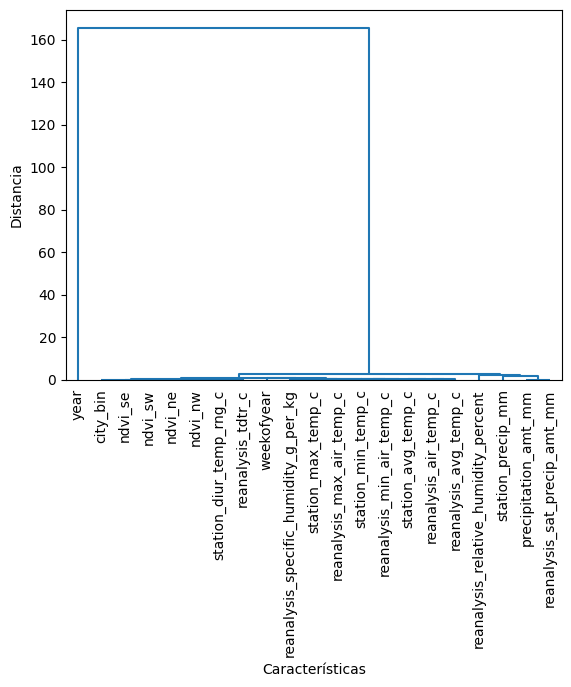

In [ ]:
dist = sklearn.metrics.DistanceMetric.get_metric('euclidean')
matdist= dist.pairwise(features_norm)
clusters = cluster.hierarchy.linkage(matdist, method = 'single')
cluster.hierarchy.dendrogram(clusters, color_threshold = 0, labels = names , leaf_rotation=90)
plt.xlabel('Características')
plt.ylabel('Distancia')
plt.show()

La escala de distancias es disparatada, por lo que se elimina la característica year y se vuelve a ejecutar el algoritmo.

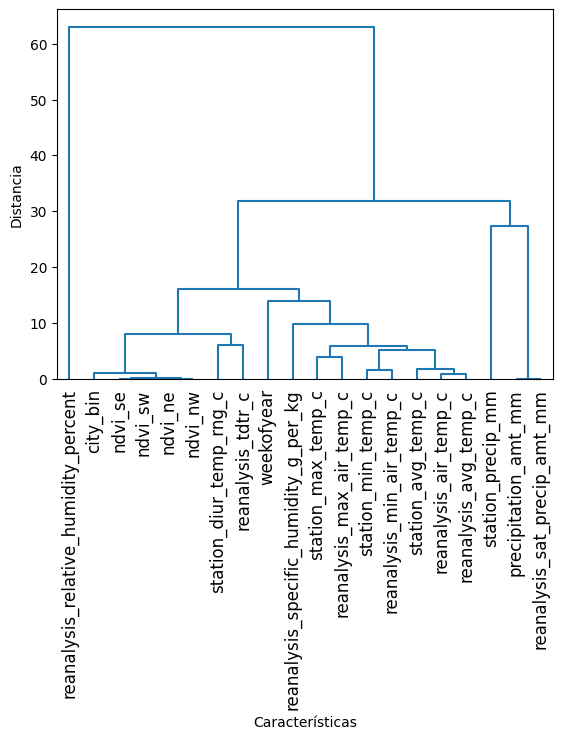

In [ ]:
train_features = train3.drop(columns = ['year']).T

names =  train_features.index

#Normalization of the data
#http://scikit-learn.org/stable/modules/preprocessing.html
min_max_scaler = preprocessing.MinMaxScaler()
features_norm = min_max_scaler.fit_transform(train_features)

#Principal Component Analysis
estimator = PCA (n_components = 4)
X_pca = estimator.fit_transform(features_norm)
#print("Componentes lineales:\n", estimator.components_)
#print("\nRatio de variabilidad: ", estimator.explained_variance_ratio_, "\n")

dist = sklearn.metrics.DistanceMetric.get_metric('euclidean')
matdist= dist.pairwise(features_norm)
clusters = cluster.hierarchy.linkage(matdist, method = 'single')
cluster.hierarchy.dendrogram(clusters, color_threshold = 0, labels = names , leaf_rotation=90)
plt.xlabel('Características')
plt.ylabel('Distancia')
plt.show()

Por curiosidad se aplica el método de silhouette para confirmar de nuevo que el número de clústers óptimo es 5.

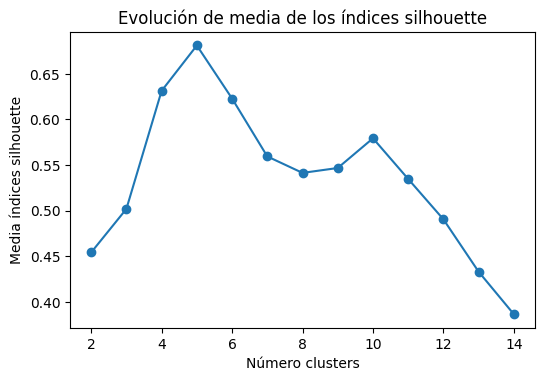

In [ ]:
# Método silhouette para identificar el número óptimo de clusters
range_n_clusters = range(2, 15)
valores_medios_silhouette = []

# Suprimir el warning específico de scipy
warnings.filterwarnings("ignore")

for n_clusters in range_n_clusters:
    modelo = AgglomerativeClustering(
                    affinity   = 'euclidean',
                    linkage    = 'ward',
                    n_clusters = n_clusters
             )

    cluster_labels = modelo.fit_predict(features_norm)
    silhouette_avg = silhouette_score(features_norm, cluster_labels)
    valores_medios_silhouette.append(silhouette_avg)

fig, ax = plt.subplots(1, 1, figsize=(6, 3.84))
ax.plot(range_n_clusters, valores_medios_silhouette, marker='o')
ax.set_title("Evolución de media de los índices silhouette")
ax.set_xlabel('Número clusters')
ax.set_ylabel('Media índices silhouette')
plt.show()

Se ve que sí, 5 es el mejor valor. Porteriormente, se eligen las características finales. Para ello se hace un listado de cada característica con el clúster al que pertenece.

In [ ]:
#Supongamos que `clusters` es el resultado del clustering jerárquico

cut = 14  # Valor de corte ad-hoc
labels = hierarchy.fcluster(clusters, cut, criterion='distance')

# Obtener nombres de columnas de train3 sin la columna 'year'
column_names = train3.drop(columns=['year']).columns

# Mostrar cada columna con su label correspondiente
for col, label in zip(column_names, labels):
    print(f"Columna: {col} vs Label: {label}")

Columna: weekofyear vs Label: 2
Columna: ndvi_ne vs Label: 1
Columna: ndvi_nw vs Label: 1
Columna: ndvi_se vs Label: 1
Columna: ndvi_sw vs Label: 1
Columna: precipitation_amt_mm vs Label: 3
Columna: reanalysis_relative_humidity_percent vs Label: 5
Columna: reanalysis_sat_precip_amt_mm vs Label: 3
Columna: reanalysis_specific_humidity_g_per_kg vs Label: 2
Columna: station_avg_temp_c vs Label: 2
Columna: station_diur_temp_rng_c vs Label: 1
Columna: station_max_temp_c vs Label: 2
Columna: station_min_temp_c vs Label: 2
Columna: station_precip_mm vs Label: 4
Columna: city_bin vs Label: 1
Columna: reanalysis_air_temp_c vs Label: 2
Columna: reanalysis_max_air_temp_c vs Label: 2
Columna: reanalysis_min_air_temp_c vs Label: 2
Columna: reanalysis_avg_temp_c vs Label: 2
Columna: reanalysis_tdtr_c vs Label: 1


Características seleccionadas: station_diur_temp_rng_c, station_avg_temp_c, precipitation_amt_mm, station_precip_mm, reanalysis_relative_humidity_percent.

---
# Clustering
---

Se aborda ahora la parte central de la actividad: el agrupamiento de datos mediante distintos algoritmos de aprendizaje no supervisado. Antes de ello, se seleccionan las características previamente elegidas.

In [ ]:
selected_features = ['station_diur_temp_rng_c', 'station_avg_temp_c', 'precipitation_amt_mm', 'station_precip_mm', 'reanalysis_relative_humidity_percent']
train_clean = train3[selected_features]

Para facilitar la interpretación de los datos (sin afectar los resultados finales), se reduce la dimensionalidad a dos mediante análisis de componentes principales (PCA). A continuación, se muestra una demostración del proceso:

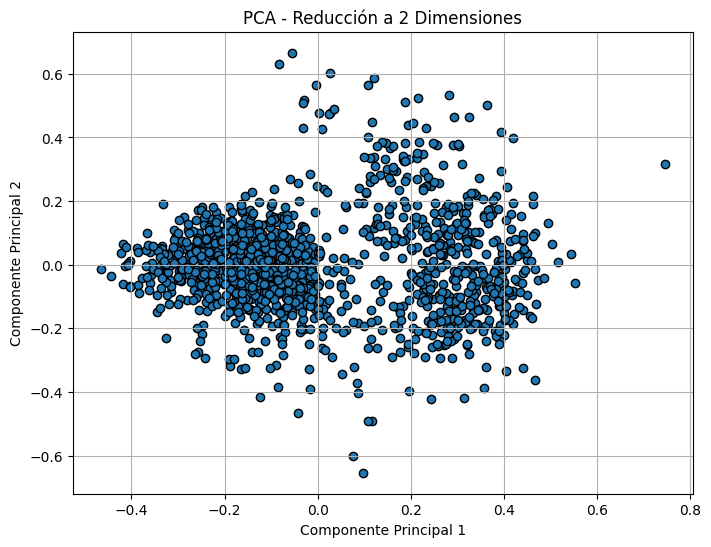

In [ ]:
#Normalización de los datos
scaler = MinMaxScaler()
df_feat_scaled = scaler.fit_transform(train_clean)

#Análisis de Componentes Principales (PCA)
pca = PCA(n_components=2)
X_pca = pca.fit_transform(df_feat_scaled)

#Obtener los nombres de las muestras
names = train_clean.index

#Graficar los resultados de PCA con nombres de muestras
plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], marker='o', edgecolors='k')

plt.xlabel('Componente Principal 1')
plt.ylabel('Componente Principal 2')
plt.title('PCA - Reducción a 2 Dimensiones')
plt.grid(True)
plt.show()


Posteriormente se normalizan los datos.

In [ ]:
#Se normalizan los datos
scaler = MinMaxScaler()
train_clean = train3[selected_features]
train_clean = scaler.fit_transform(train_clean)

## KMeans

K-Means busca dividir los datos en k clusters, asignando cada punto al centroide más cercano. En esta fase, se reutiliza el algoritmo para realizar el clustering. La técnica de Elbow proporciona una estimación fiable del número óptimo de clusters, que se utilizará en los demás algoritmos.

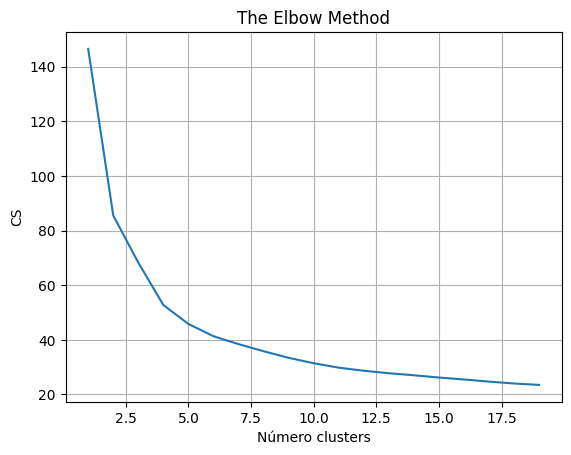

In [ ]:
cs = []
for i in range(1, 20):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(train_clean)
    cs.append(kmeans.inertia_)
plt.plot(range(1, 20), cs)
plt.title('The Elbow Method')
plt.xlabel('Número clusters')
plt.ylabel('CS')
plt.grid()
plt.show()

A primera vista se ve que el número de clústers óptimo es 5, aunque también se representarán aquellas distribuciones conformadas por 2,3 y 4 clústers.

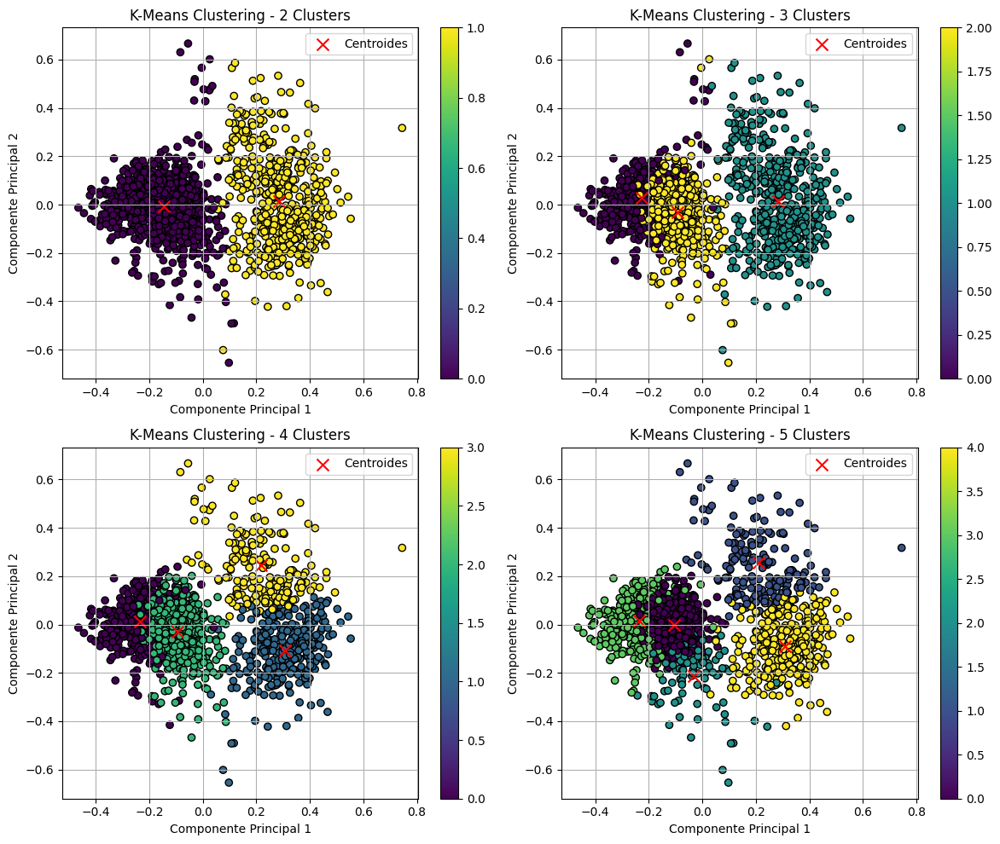

In [ ]:
X_scaled = train_clean

# Definir números de clusters para iterar
num_clusters = [2, 3, 4, 5]

# Configurar subplots
fig, axs = plt.subplots(2, 2, figsize=(12, 10))
axs = axs.flatten()  # Convertir matriz de subplots a un arreglo 1D

# Crear y ajustar el modelo PCA
estimator = PCA(n_components=2)
X_pca = estimator.fit_transform(X_scaled)

for i, n_clusters in enumerate(num_clusters):
    # Crear y ajustar el modelo de K-Means
    kmeans = KMeans(n_clusters=n_clusters, random_state=0)
    kmeans.fit(X_scaled)
    centroides = kmeans.cluster_centers_

    # Transformar centroides al espacio PCA
    centroids_pca_space = estimator.transform(centroides)

    # Graficar los clusters encontrados por K-Means en el subplot correspondiente
    ax = axs[i]
    scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], c=kmeans.labels_, cmap='viridis', marker='o', edgecolors='k')
    ax.scatter(centroids_pca_space[:, 0], centroids_pca_space[:, 1], marker='x', s=100, c='red', label='Centroides')
    ax.set_xlabel('Componente Principal 1')
    ax.set_ylabel('Componente Principal 2')
    ax.set_title(f'K-Means Clustering - {n_clusters} Clusters')
    ax.legend()
    ax.grid(True)
    fig.colorbar(scatter, ax=ax)  # Añadir barra de color basada en el gráfico de dispersión

# Ajustar el espaciado entre subplots y mostrar la figura
plt.tight_layout()
plt.show()


Los resultados son, a priori, bastante satisfactorios. Lo bien que se ve la distribución de los clústers en la primera gráfica da para plantearse una revisión a futuro de sí el número óptico de agrupaciones es 2.

## Clustering jerárquico aglomerativo

Se continúa con los algoritmos básicos estudiados en clase. La segunda opción es el clustering jerárquico aglomerativo, que, aunque menos potente que K-Means, funciona bien en datasets con poco ruido y pocas instancias.

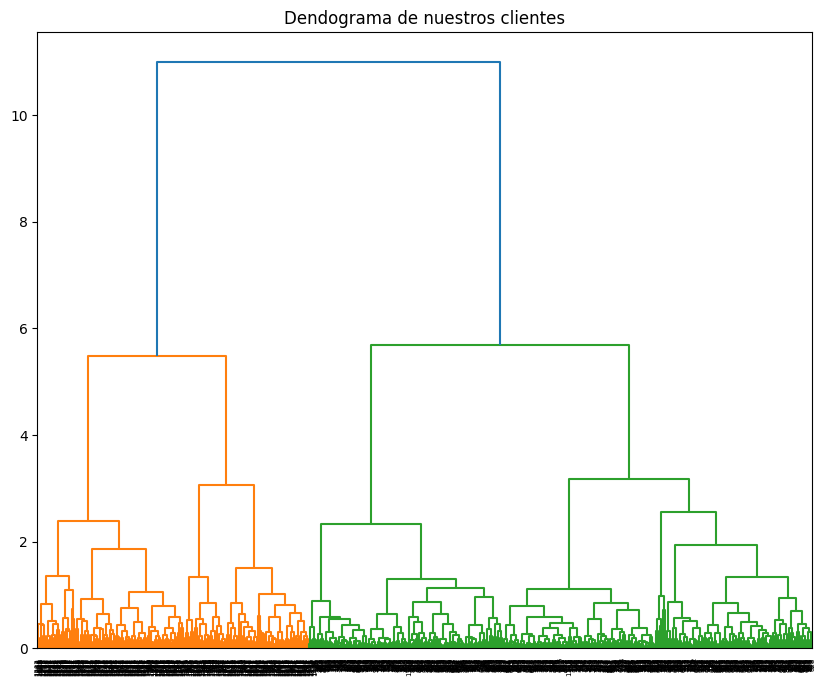

In [ ]:
# realizamos el clustering
plt.figure(figsize=(10, 8))
plt.title("Dendograma de nuestros clientes")
Z = linkage(train_clean, method='ward')  # ward es otro método de clustering jerárquico que podéis estudiar aquí: https://es.wikipedia.org/wiki/M%C3%A9todo_de_Ward
dendograma = dendrogram(Z)

Mientras que los resultados serían:

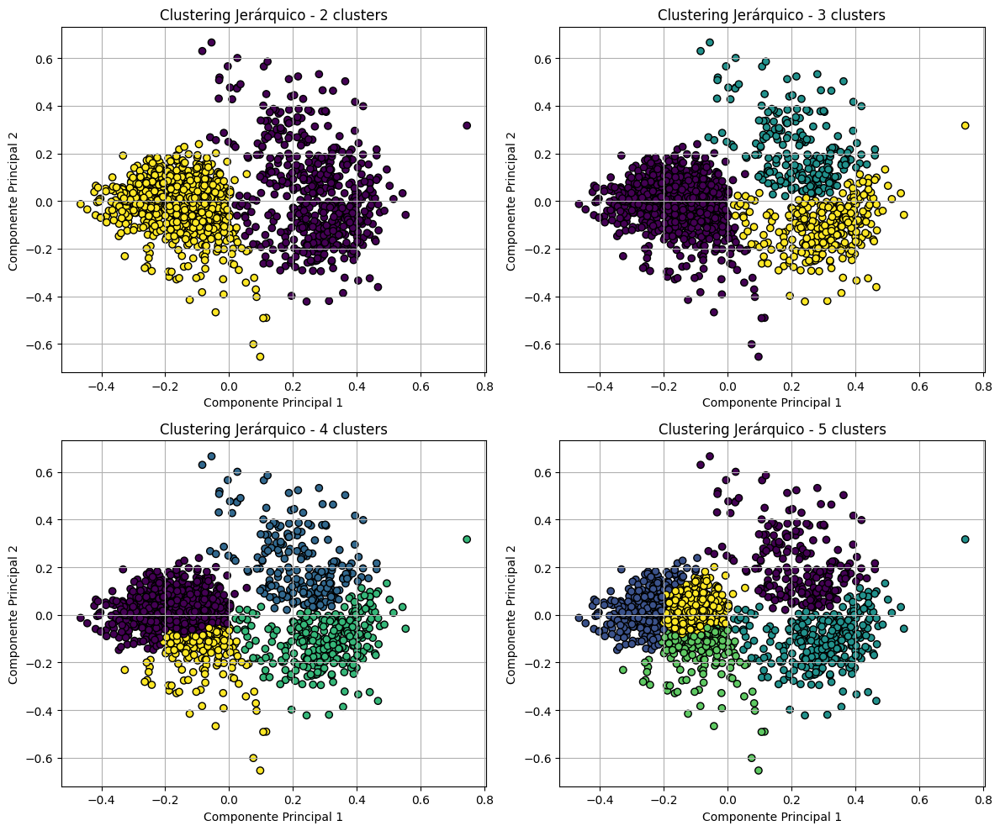

In [ ]:
# Suponiendo que X_pca contiene tus datos transformados por PCA

# Números de clusters que quieres probar
num_clusters = [2, 3, 4, 5]

# Configurar subplots
fig, axs = plt.subplots(2, 2, figsize=(12, 10))
axs = axs.flatten()  # Convertir matriz de subplots a un arreglo 1D

for i, n_clusters in enumerate(num_clusters):
    # Ajustar el modelo de clustering jerárquico
    cluster = AgglomerativeClustering(n_clusters=n_clusters, affinity='euclidean', linkage='ward')
    clusters = cluster.fit_predict(X_pca)

    # Graficar los clusters encontrados en el subplot correspondiente
    ax = axs[i]
    ax.scatter(X_pca[:, 0], X_pca[:, 1], c=clusters, cmap='viridis', marker='o', edgecolors='k')
    ax.set_title(f'Clustering Jerárquico - {n_clusters} clusters')
    ax.set_xlabel('Componente Principal 1')
    ax.set_ylabel('Componente Principal 2')
    ax.grid(True)


# Ajustar el espacio entre subplots y mostrar la figura
plt.tight_layout()
plt.show()


Los resultados son muy similares al algoritmo de Kmeans. Cabe recalcar que se nota un rendimiento menor, factor a tener en cuenta en las conclusiones finales del trabajo.

## Dbscan


Se busca utilizar un algoritmo con un enfoque distinto. Dbscan es una técnica que tiene un mejor rendimiento que las anteriores. Se basa en la densidad de puntos y es capaz de localizar outliers que no son agrupados en ningún cluster.

In [ ]:
for eps in np.arange(0.09, 0.11, 0.0005):
  db = DBSCAN(eps, min_samples=minPts).fit(X_pca)
  core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
  core_samples_mask[db.core_sample_indices_] = True
  labels = db.labels_
  n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
  n_outliers = list(labels).count(-1)
  print ("%6.3f, %d, %d" % (eps, n_clusters_, n_outliers))

 0.090, 6, 1
 0.090, 5, 1
 0.091, 4, 1
 0.091, 3, 1
 0.092, 3, 1
 0.092, 3, 1
 0.093, 3, 1
 0.093, 3, 1
 0.094, 3, 1
 0.095, 3, 1
 0.095, 3, 1
 0.096, 3, 1
 0.096, 3, 1
 0.097, 3, 1
 0.097, 3, 1
 0.098, 3, 1
 0.098, 3, 1
 0.099, 3, 1
 0.099, 3, 1
 0.100, 3, 1
 0.100, 3, 1
 0.101, 3, 1
 0.101, 3, 1
 0.102, 3, 1
 0.102, 3, 1
 0.103, 2, 1
 0.103, 2, 1
 0.104, 2, 1
 0.104, 2, 1
 0.105, 2, 1
 0.105, 2, 1
 0.106, 2, 1
 0.106, 2, 1
 0.107, 2, 1
 0.107, 2, 1
 0.108, 2, 1
 0.108, 2, 1
 0.109, 2, 1
 0.109, 2, 1
 0.110, 2, 1
 0.110, 2, 1


Los resultados de epsilon para los distintos números de clusters son: 0.129, 0.138, 0.144 y 0.147 (5,4,3,2 clústers respectivamente).

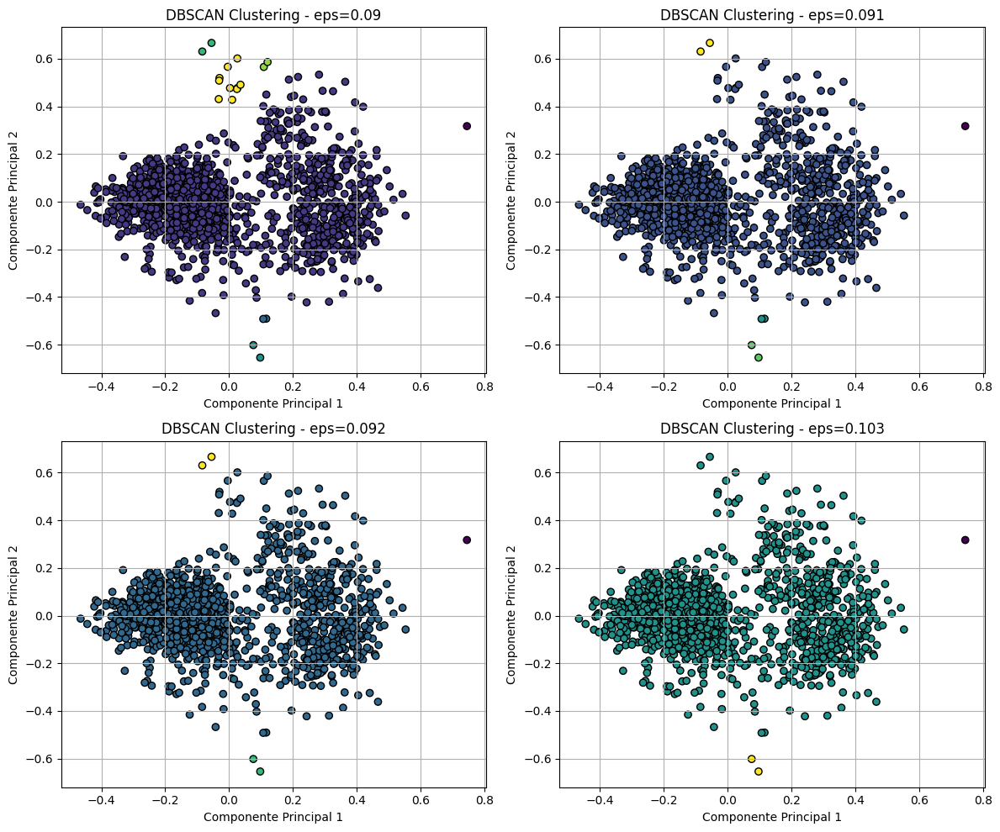

In [ ]:
# Valores de epsilon (radio de vecindad) que quieres probar
eps_values = [0.09, 0.091, 0.092, 0.103]

# Configurar subplots
fig, axs = plt.subplots(2, 2, figsize=(12, 10))
axs = axs.flatten()  # Convertir matriz de subplots a un arreglo 1D

for i, eps in enumerate(eps_values):
    # Ajustar el modelo de DBSCAN
    dbscan = DBSCAN(eps=eps, min_samples=2)  # Puedes ajustar min_samples según tus datos
    clusters = dbscan.fit_predict(X_pca)

    # Graficar los clusters encontrados en el subplot correspondiente
    ax = axs[i]
    scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], c=clusters, cmap='viridis', marker='o', edgecolors='k')
    ax.set_title(f'DBSCAN Clustering - eps={eps}')
    ax.set_xlabel('Componente Principal 1')
    ax.set_ylabel('Componente Principal 2')
    ax.grid(True)

# Ajustar el espacio entre subplots y mostrar la figura
plt.tight_layout()
plt.show()


Esta técnica, a priori, no ha tenido buenos resultados.

## Spectral Clustering

Spectral Clustering utiliza la estructura de los autovalores para agrupar datos, modelándolos como un grafo donde los puntos son nodos y las conexiones dependen de su similitud. Este método captura relaciones complejas sin asumir formas específicas de clusters. Su principal inconveniente es el rendimiento, aunque no representa un problema en este caso debido al tamaño del dataset.

https://www.geeksforgeeks.org/ml-spectral-clustering/

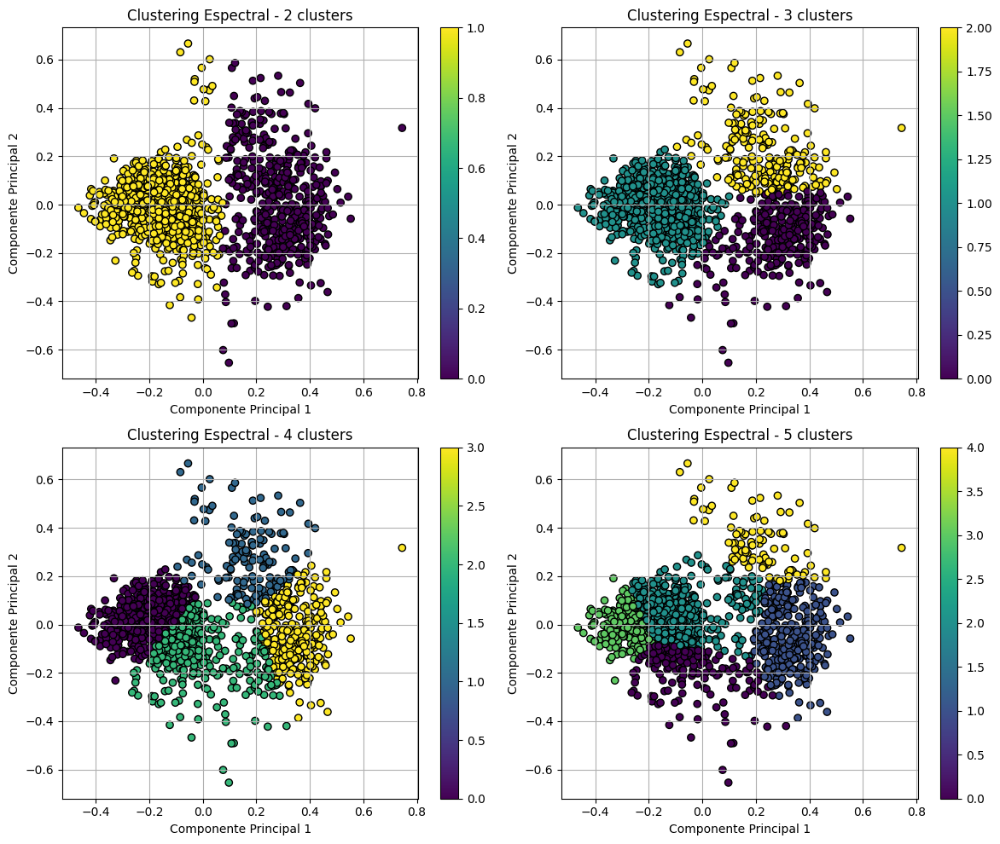

In [ ]:
# Números de clusters que quieres probar
num_clusters = [2, 3, 4, 5]

# Configurar subplots
fig, axs = plt.subplots(2, 2, figsize=(12, 10))
axs = axs.flatten()  # Convertir matriz de subplots a un arreglo 1D

for i, n_clusters in enumerate(num_clusters):
    # Ajustar el modelo de Spectral Clustering
    spectral_model_rbf = SpectralClustering(n_clusters=n_clusters, affinity='rbf', random_state=0)
    clusters = spectral_model_rbf.fit_predict(X_pca)

    # Graficar los clusters encontrados en el subplot correspondiente
    ax = axs[i]
    scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], c=clusters, cmap='viridis', marker='o', edgecolors='k')
    ax.set_title(f'Clustering Espectral - {n_clusters} clusters')
    ax.set_xlabel('Componente Principal 1')
    ax.set_ylabel('Componente Principal 2')
    ax.grid(True)
    fig.colorbar(scatter, ax=ax)  # Añadir barra de color basada en el gráfico de dispersión

# Ajustar el espacio entre subplots y mostrar la figura
plt.tight_layout()
plt.show()

Los resultados parecen muy satisfactorios y el rendimiento ha sido mejor de lo esperado.

---
# Conclusiones
---

Este estudio incluye cuatro algoritmos de clustering, todos utilizando la misma selección de características: station_diur_temp_rng_c, station_avg_temp_c, precipitation_amt_mm, station_precip_mm y reanalysis_relative_humidity_percent.

En cuanto a la elección del mejor algoritmo, DBSCAN ha obtenido los peores resultados, posiblemente debido a la métrica de distancia empleada o a las características del dataset. Dado que no se cuenta con una variable objetivo, la comparación entre los demás algoritmos no es exacta. Por ello, se evaluarán según distribución de puntos, rendimiento y tolerancia al ruido. A continuación, se analiza cada algoritmo en detalle:

*   **Kmeans:** tiene un alto rendimiento pero la distribución de puntos no es uniforme. Presenta una gran discordancia con respecto al número de datos por cluster. Además, tiene poca tolerancia al ruido.
*  **Clustering jerárquico aglomerativo:** tiene un rendimiento más bajo y poca tolerancia al ruido.
*  **Spectral clustering:** presenta la mejor distribución de puntos y tolerancia al ruido, a pesar de su peor rendimiento.

En este contexto, Spectral Clustering es la mejor opción, ya que el rendimiento no es una limitación significativa debido al tamaño moderado del dataset. Sin embargo, sería recomendable un análisis más profundo con técnicas avanzadas y una evaluación más detallada del número óptimo de clusters. A pesar de la pérdida de información por la reducción de dimensionalidad, las distribuciones obtenidas, especialmente la de dos clusters, han mostrado buenos resultados.

En general, el proyecto ha sido didáctico y ha permitido resolver diversas problemáticas, logrando resultados satisfactorios.